# Clusterización por tipo de consumo

Primero importamos las librerias necesarias

In [0]:
pip install yellowbrick

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.6/282.6 kB 6.1 MB/s eta 0:00:00
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
import numpy as np # Para trabajo con vectores
import pandas as pd # Para manipulación y análisis de datos
import seaborn as sns # Para graficar
import matplotlib.pyplot as plt # Para graficar
from matplotlib import colors 
import matplotlib.font_manager
from yellowbrick.cluster import KElbowVisualizer # Librería diseñada para representar el número correcto de clústers.
from sklearn.cluster import KMeans, AgglomerativeClustering, MiniBatchKMeans # Algoritmos no supervisados a implementar.
from sklearn.metrics import silhouette_samples, silhouette_score # Métricas para gráficas Silhouette
import matplotlib.cm as cm # Color Manager
import warnings
warnings.filterwarnings("ignore") # Cancelar Warnings

Después pivoteamos la tabla de resultados y llenamos las categorías donde el cliente no ha consumido con 0.

In [0]:
%sql
USE tfm_staging

In [0]:
df = spark.sql("SELECT * FROM temp_view_client_new_category")
df = df.groupBy("CLIENTE_ID").pivot("NUEVA_CATEGORIA").sum("CONSUMO_CATEGORIA").fillna(0)

df.display() # Veamos la tabla final

CLIENTE_ID,COLAS,HOGAR,OTROS,SABORES
0100000204,0.6830000281333923,0.10600000130943954,0.02399999974295497,0.18699999898672104
0100000231,0.7269999980926514,0.09900000307243317,0.008000000263564289,0.16499999910593033
0100000262,0.7570000290870667,0.0719999986467883,0.011999999871477485,0.159000001847744
0100000283,0.7440000176429749,0.07500000088475645,0.014999999664723873,0.1639999970793724
0100000289,0.7990000247955322,0.08400000107940286,0.0070000000996515155,0.10900000110268593
0100000292,0.8370000123977661,0.043000000063329935,0.009000000078231096,0.10999999940395355
0100000300,0.781000018119812,0.07300000020768493,0.009000000078231096,0.13600000366568565
0100000317,0.7639999985694885,0.11299999943003058,0.014999999664723873,0.10699999704957008
0100000320,0.6940000057220459,0.12499999802093953,0.01100000028964132,0.17100000381469727
0100000323,0.7289999723434448,0.12099999957717955,0.013999999966472387,0.1380000002682209


Después de haber reducido las dimensiones a solo registros por cliente, procederemos a usar Pandas por su facilidad al implementar librerías de Data Science

In [0]:
dfPandas = df.toPandas()
list_name = dfPandas.loc[:, dfPandas.columns != 'CLIENTE_ID'].columns.tolist() # Seleccionamos las columnas a transformar.
list_name

['COLAS', 'HOGAR', 'OTROS', 'SABORES']

In [0]:
clustering= dfPandas[[c for c in dfPandas.columns if c in list_name]]  #Reducimos el dataset a clusterizar
clustering.describe().T

,count,mean,std,min,25%,50%,75%,max
COLAS,23985.0,0.739668,0.158749,0.0,0.676,0.758,0.837,1.000
HOGAR,23985.0,0.065034,0.092005,0.0,0.012,0.045,0.088,1.001
OTROS,23985.0,0.012646,0.030886,0.0,0.000,0.006,0.015,1.000
SABORES,23985.0,0.182639,0.132431,0.0,0.109,0.163,0.219,1.000


In [0]:
df_box = spark.sql("SELECT * FROM temp_view_client_new_category").toPandas()


In [0]:
df_box.display()

CLIENTE_ID,NUEVA_CATEGORIA,CONSUMO_CATEGORIA
0100000204,HOGAR,0.009
0100000204,SABORES,0.139
0100000204,OTROS,0.02
0100000204,HOGAR,0.027
0100000204,HOGAR,0.02
0100000204,HOGAR,0.002
0100000204,OTROS,0.004
0100000204,HOGAR,0.007
0100000204,COLAS,0.683
0100000204,SABORES,0.048


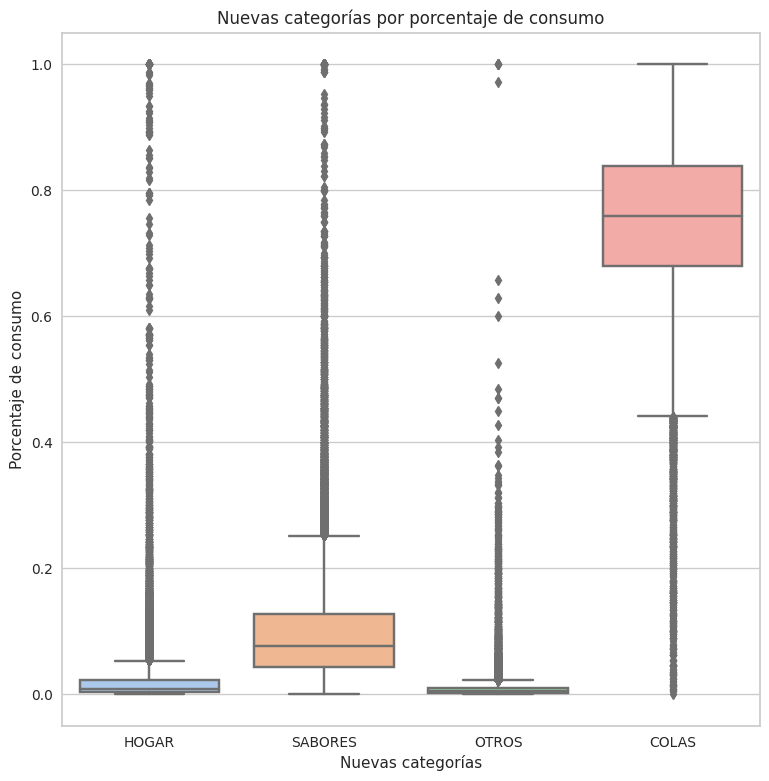

In [0]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
plt.figure(figsize=(9,9))

ax = sns.boxplot(data=df_box, x="NUEVA_CATEGORIA", y="CONSUMO_CATEGORIA", palette=sns.color_palette("pastel", 8))
ax.set(xlabel='Nuevas categorías')
ax.set(ylabel='Porcentaje de consumo')
ax.set_title('Nuevas categorías por porcentaje de consumo');

Detección de Outliers


<Figure size 800x550 with 0 Axes>

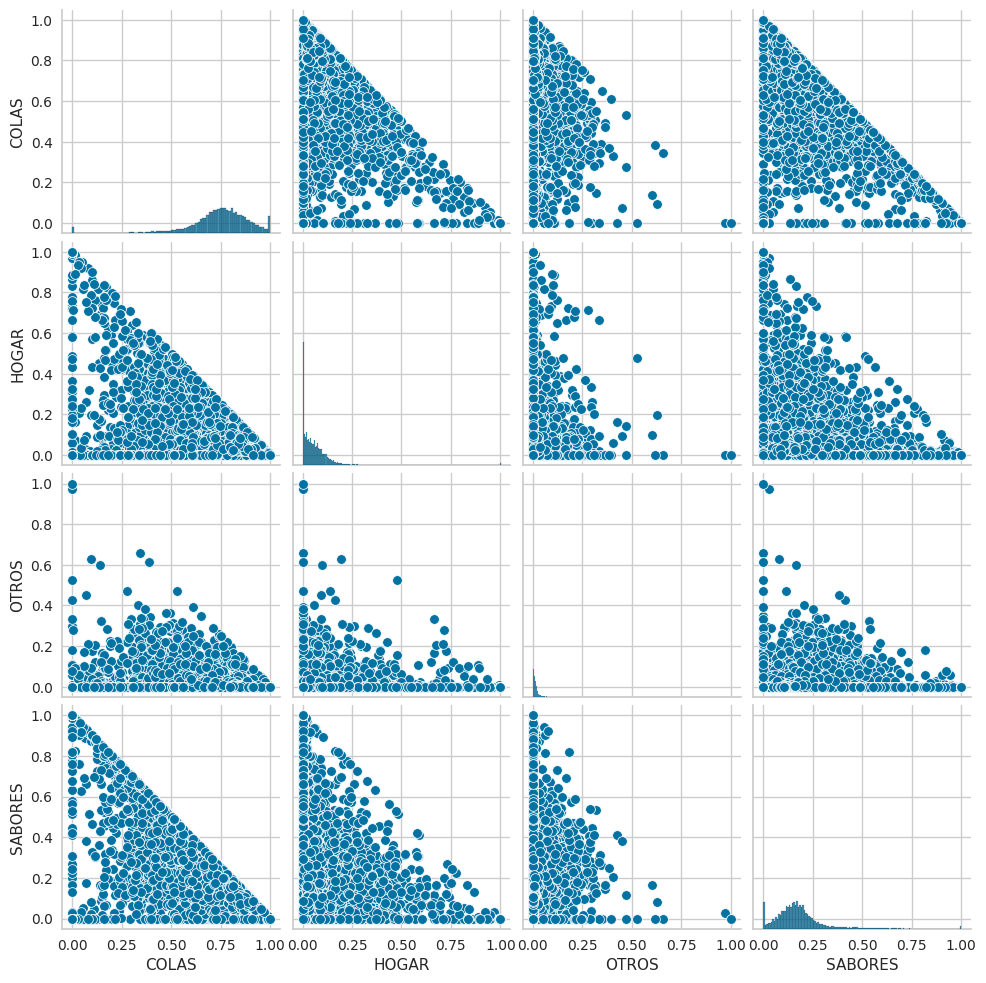

In [0]:
print("Detección de Outliers")
plt.figure()
sns.pairplot(clustering)
plt.show();

# Clustering

Evaluaremos las técnicas Kmeans, Jerárquico Aglomerativo y KBatchMeans con las métricas silhouette, distorsión y Calinski Harabasz.

For n_clusters = 3 The average silhouette_score is : 0.41239541338802127


For n_clusters = 4 The average silhouette_score is : 0.42835818594649355
For n_clusters = 5 The average silhouette_score is : 0.4261282788152674
For n_clusters = 6 The average silhouette_score is : 0.3736828704144805


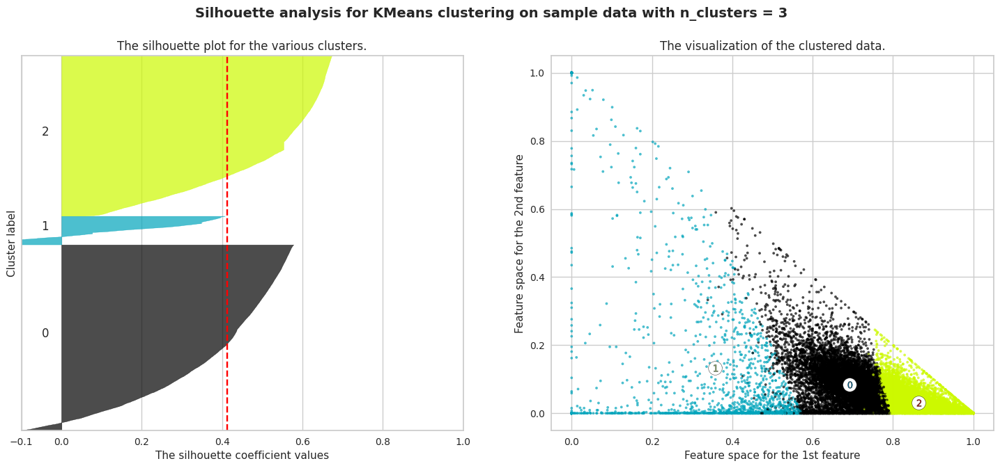

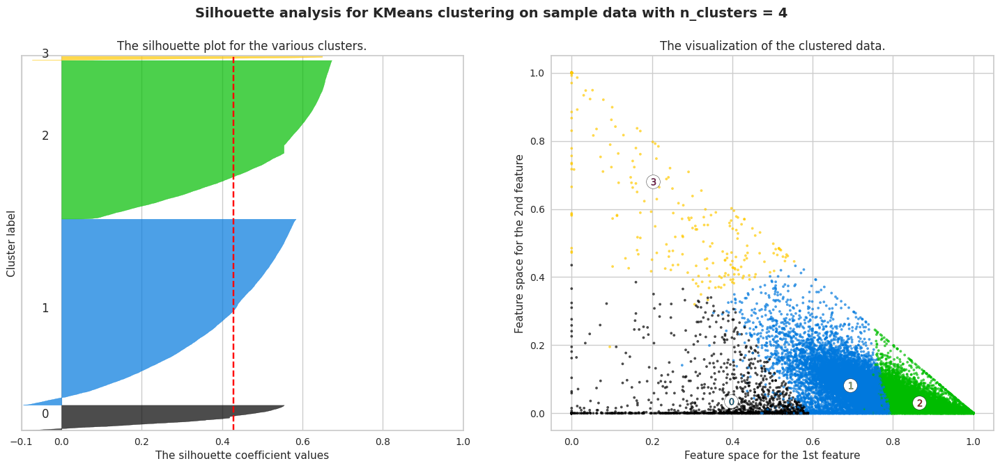

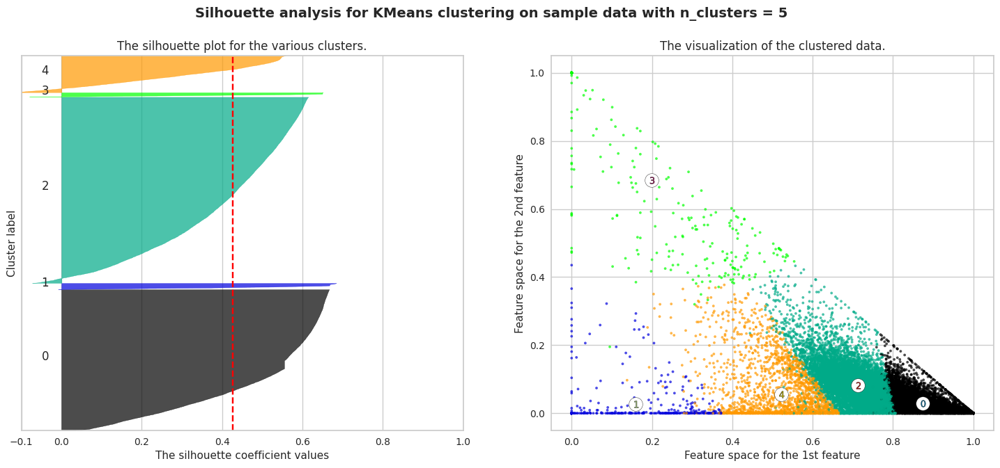

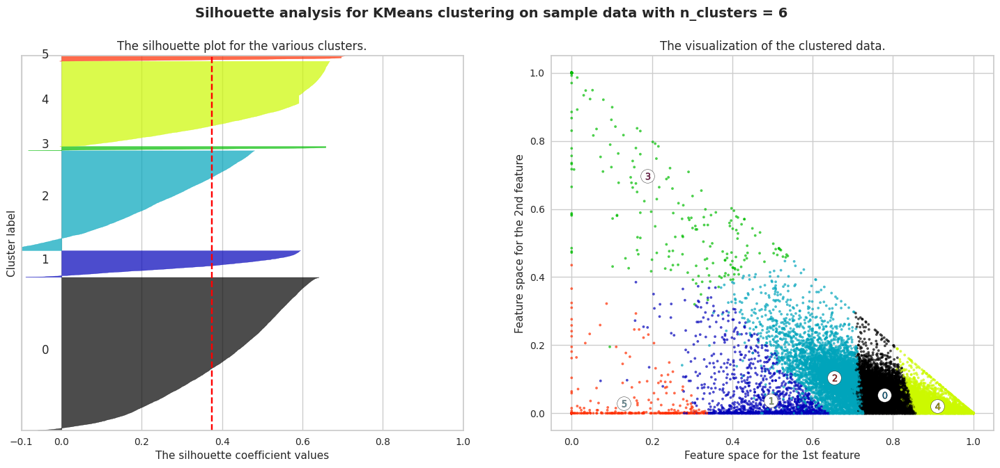

In [0]:
# Código Scikit Learn para Silhouette Score

X= clustering.to_numpy()
range_n_clusters = [3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

For n_clusters = 3 The average silhouette_score is : 0.4130204280069201
For n_clusters = 4 The average silhouette_score is : 0.43087358646012325
For n_clusters = 5 The average silhouette_score is : 0.38911853637568106
For n_clusters = 6 The average silhouette_score is : 0.379858581485863


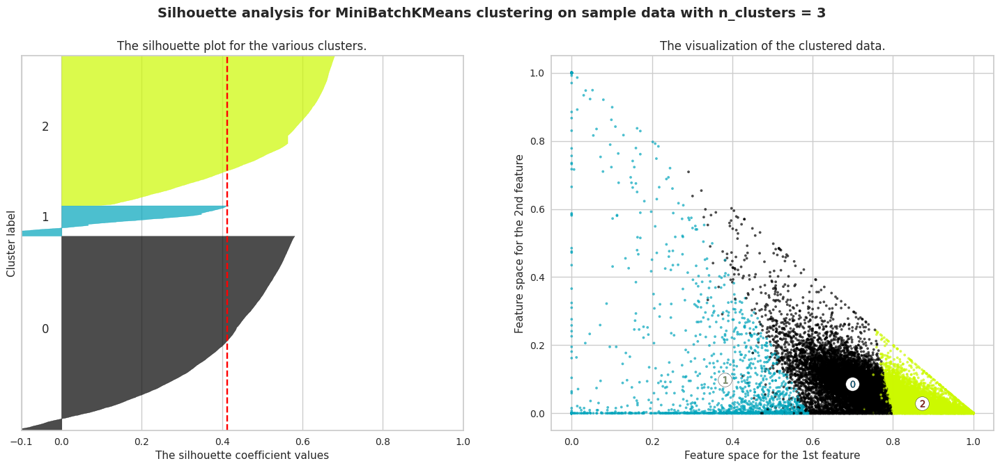

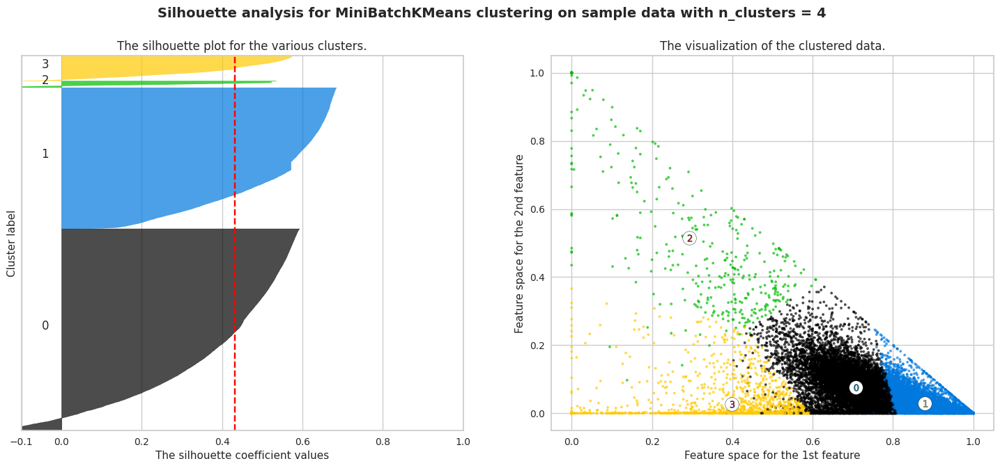

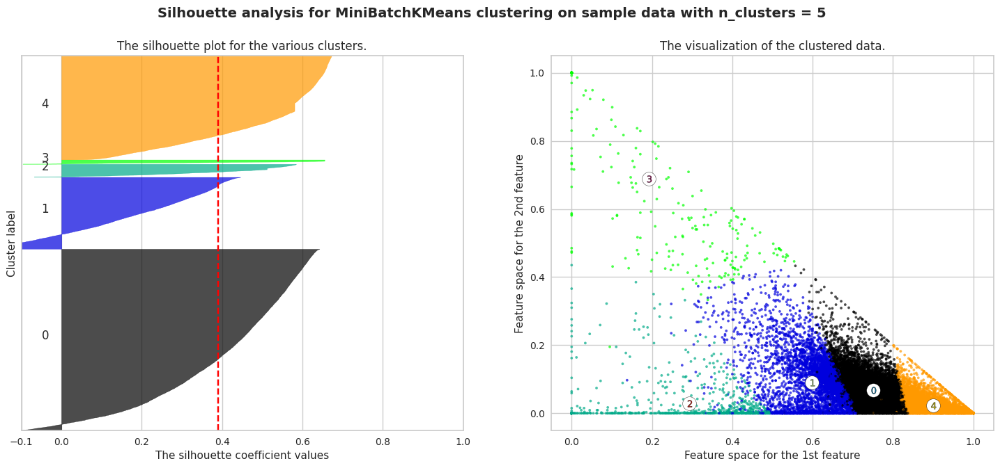

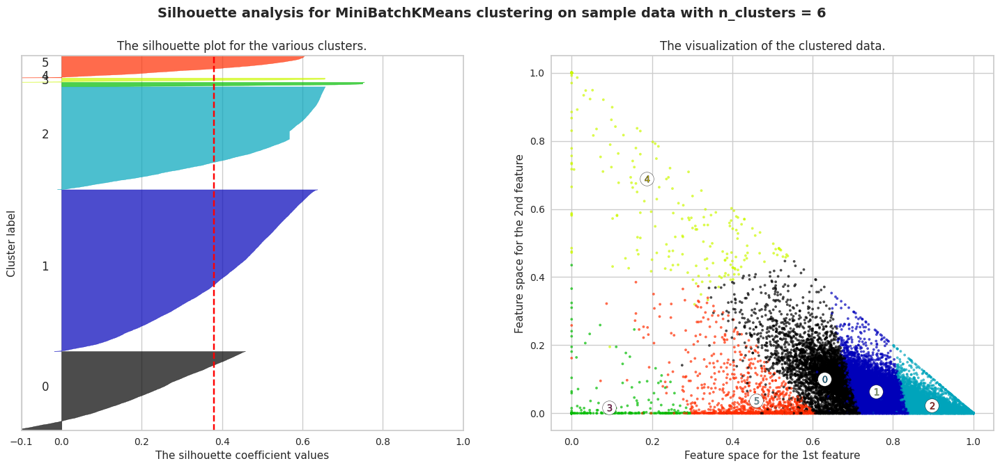

In [0]:
# Código Scikit Learn para Silhouette Score

range_n_clusters = [3, 4, 5, 6 ]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = MiniBatchKMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for MiniBatchKMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Calinski Harabasz to determine the number of clusters to be formed:


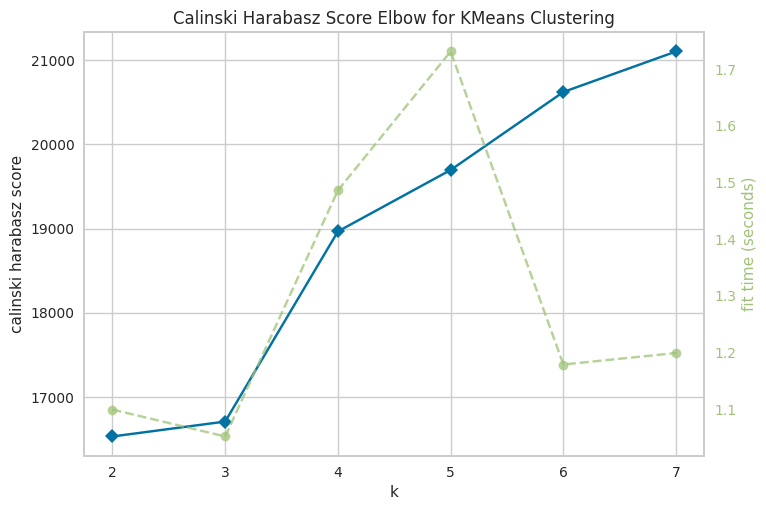

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = KMeans()

print('Calinski Harabasz to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='calinski_harabasz', timings= True, locate_elbow='False')
Elbow_M.fit(clustering)
Elbow_M.poof();

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = AgglomerativeClustering()

print('Calinski Harabasz to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='calinski_harabasz', timings= True, locate_elbow=False)
Elbow_M.fit(clustering)
Elbow_M.poof();

Calinski Harabasz to determine the number of clusters to be formed:


Calinski Harabasz to determine the number of clusters to be formed:


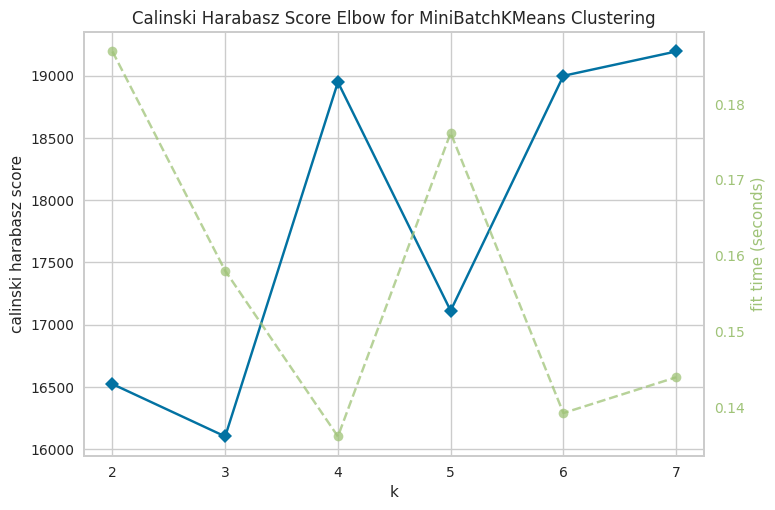

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = MiniBatchKMeans()

print('Calinski Harabasz to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='calinski_harabasz', timings= True, locate_elbow=False)
Elbow_M.fit(clustering)
Elbow_M.poof();

Silhouette to determine the number of clusters to be formed:


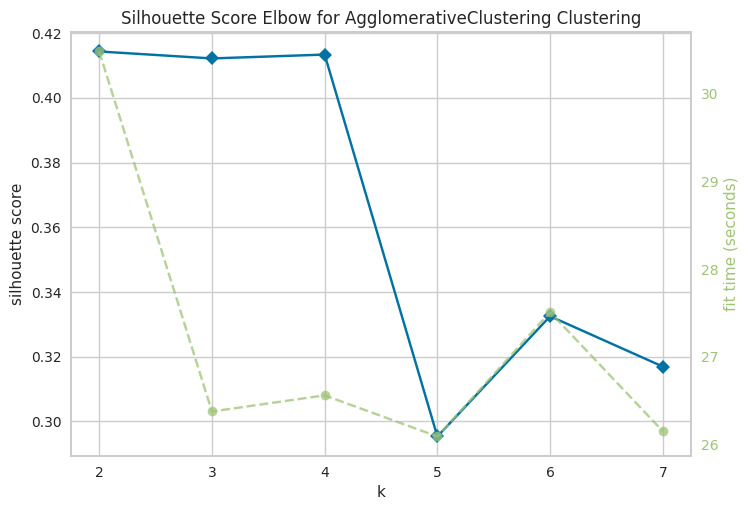

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = AgglomerativeClustering()

print('Silhouette to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='silhouette', timings= True, locate_elbow=False)
Elbow_M.fit(clustering)
Elbow_M.poof();

Silhouette to determine the number of clusters to be formed:


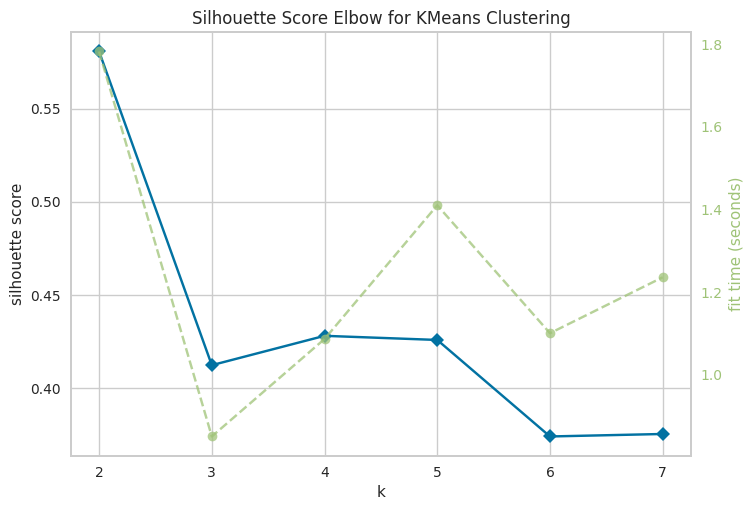

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = KMeans()

print('Silhouette to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='silhouette', timings= True, locate_elbow=False)
Elbow_M.fit(clustering)
Elbow_M.poof();

Silhouette to determine the number of clusters to be formed:


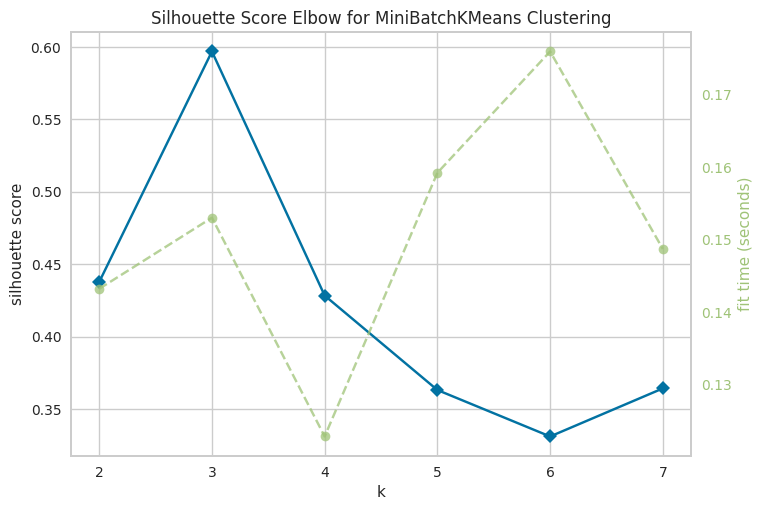

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = MiniBatchKMeans()

print('Silhouette to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(model, k=7,metric='silhouette', timings= True, locate_elbow=False)
Elbow_M.fit(clustering)
Elbow_M.poof();

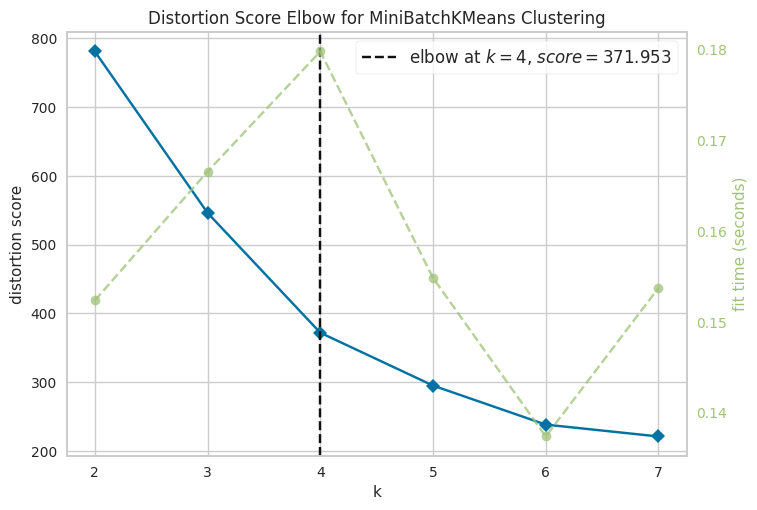

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = MiniBatchKMeans()
Elbow_M = KElbowVisualizer(model, k=7, timings= True, locate_elbow=True)
Elbow_M.fit(clustering)
Elbow_M.show();

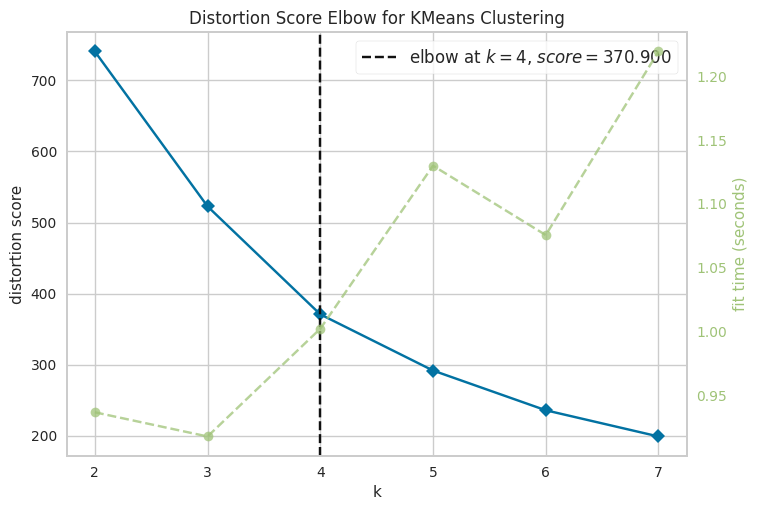

In [0]:
# Quick examination of elbow method to find numbers of clusters to make.
model = KMeans()
Elbow_M = KElbowVisualizer(model, k=7, timings= True, locate_elbow=True)
Elbow_M.fit(clustering)
Elbow_M.show();

In [0]:
pal = ["#682F2F","#B9C0C9", "#D6B2B1", "#9F8A78","#F3AB60"] 
sns.set(rc={"axes.facecolor":"#FFFFFF","figure.facecolor":"#FFFFFF"})

km3 = KMeans(n_clusters=4).fit(clustering)

In [0]:
df_clustered= dfPandas[[c for c in dfPandas.columns if c in ['SABORES', 'COLAS', 'HOGAR', 'OTROS']]].copy()
df_clustered['Labels_Kmeans'] = km3.labels_

In [0]:
pd.set_option('display.max_rows', None)
df_clustered.groupby('Labels_Kmeans').describe().T

Labels_Kmeans             0             1            2           3
COLAS   count  11815.000000  10302.000000  1584.000000  284.000000
        mean       0.691013      0.863553     0.393220    0.202236
        std        0.066625      0.063183     0.165361    0.181734
        min        0.275000      0.710000     0.000000    0.000000
        25%        0.653000      0.812000     0.328000    0.000000
        50%        0.704000      0.851000     0.443000    0.199000
        75%        0.742000      0.905000     0.519000    0.377000
        max        0.793000      1.000000     0.588000    0.554000
HOGAR   count  11815.000000  10302.000000  1584.000000  284.000000
        mean       0.083345      0.031645     0.035368    0.679919
        std        0.061116      0.032099     0.069949    0.240138
        min        0.000000      0.000000     0.000000    0.195000
        25%        0.042000      0.006000     0.000000    0.462750
        50%        0.077000      0.023000     0.001000    0.589500
        75%        0.112000      0.048000     0.033000    1.000000
        max        0.433000      0.261000     0.435000    1.001000
OTROS   count  11815.000000  10302.000000  1584.000000  284.000000
        mean       0.016088      0.006776     0.022704    0.026268
        std        0.026998      0.013211     0.080826    0.070860
        min        0.000000      0.000000     0.000000    0.000000
        25%        0.003000      0.000000     0.000000    0.000000
        50%        0.011000      0.003000     0.000000    0.000000
        75%        0.019000      0.009000     0.006000    0.012000
        max        0.657000      0.290000     1.000000    0.629000
SABORES count  11815.000000  10302.000000  1584.000000  284.000000
        mean       0.209532      0.098023     0.548689    0.091588
        std        0.061253      0.050504     0.176909    0.112556
        min        0.000000      0.000000     0.000000    0.000000
        25%        0.170000      0.064000     0.436000    0.000000
        50%        0.201000      0.105000     0.494000    0.048500
        75%        0.241000      0.136000     0.603000    0.158250
        max        0.411000      0.206000     1.000000    0.528000

In [0]:
pal = ["#682F2F","#B9C0C9", "#D6B2B1", "#9F8A78","#F3AB60"]
sns.set(rc={"axes.facecolor":"#FFFFFF","figure.facecolor":"#FFFFFF"})

In [0]:
df_clustered['Labels_Kmeans'] = df_clustered['Labels_Kmeans']+1

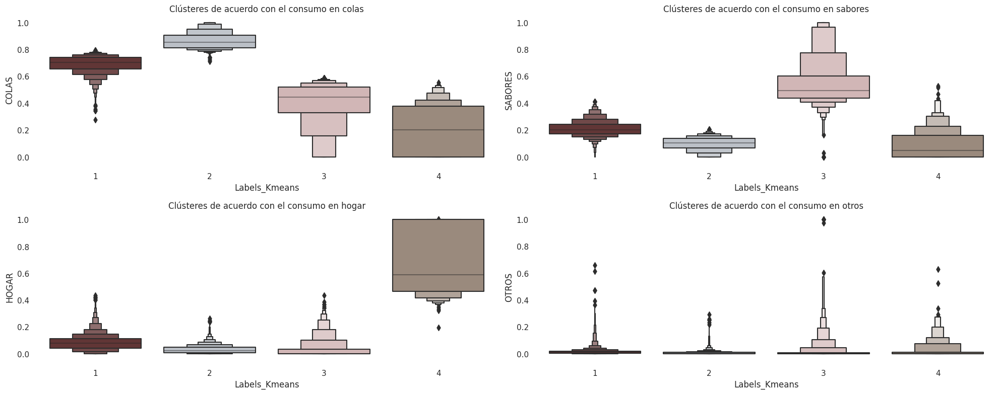

In [0]:
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(221)
pl = sns.boxenplot(x='Labels_Kmeans', y='COLAS', data=df_clustered, ax=ax, palette=pal)
ax.set_title('Clústeres de acuerdo con el consumo en colas')
ax = fig.add_subplot(222)
pl = sns.boxenplot(x='Labels_Kmeans', y='SABORES', data=df_clustered, ax=ax,palette=pal)
ax.set_title('Clústeres de acuerdo con el consumo en sabores')
ax = fig.add_subplot(223)
pl = sns.boxenplot(x='Labels_Kmeans', y='HOGAR', data=df_clustered, ax=ax,palette=pal)
ax.set_title('Clústeres de acuerdo con el consumo en hogar')
ax = fig.add_subplot(224)
pl = sns.boxenplot(x='Labels_Kmeans', y='OTROS', data=df_clustered, ax=ax,palette=pal)
ax.set_title('Clústeres de acuerdo con el consumo en otros')
fig.tight_layout()
plt.show()

In [0]:
dfPandas['CLUSTER'] = km3.labels_
dfPandas.display()

CLIENTE_ID,COLAS,HOGAR,OTROS,SABORES,CLUSTER
0100000204,0.6830000281333923,0.10600000130943954,0.02399999974295497,0.18699999898672104,0
0100000231,0.7269999980926514,0.09900000307243317,0.008000000263564289,0.16499999910593033,0
0100000262,0.7570000290870667,0.0719999986467883,0.011999999871477485,0.159000001847744,0
0100000283,0.7440000176429749,0.07500000088475645,0.014999999664723873,0.1639999970793724,0
0100000289,0.7990000247955322,0.08400000107940286,0.0070000000996515155,0.10900000110268593,1
0100000292,0.8370000123977661,0.043000000063329935,0.009000000078231096,0.10999999940395355,1
0100000300,0.781000018119812,0.07300000020768493,0.009000000078231096,0.13600000366568565,1
0100000317,0.7639999985694885,0.11299999943003058,0.014999999664723873,0.10699999704957008,1
0100000320,0.6940000057220459,0.12499999802093953,0.01100000028964132,0.17100000381469727,0
0100000323,0.7289999723434448,0.12099999957717955,0.013999999966472387,0.1380000002682209,0


In [0]:
dfPandas.write.format("parquet").mode("overwrite").save("/mnt/datalakerbi/datamodel/fact_client_consume.parquet")